## **Business Question** 
Predict the customer's **total spending amount for the next month**,
enabling them to better budget their finances and plan their expenses more effectively, potentially reducing financial stress and improving financial health.



## 0. import pakages 

In [172]:
# import packages


import os
import pandas as pd
from dataprep.eda import plot
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from mpl_toolkits.basemap import Basemap
import numpy as np

import warnings
warnings.filterwarnings("ignore")

In [235]:
! pip install -r https://raw.githubusercontent.com/aso-uts/labs_datasets/main/36106-mlaa/requirements.txt

  Using cached pandas-2.1.1-cp310-cp310-win_amd64.whl (10.7 MB)
  Attempting uninstall: pandas
    Found existing installation: pandas 1.5.3
    Uninstalling pandas-1.5.3:
      Successfully uninstalled pandas-1.5.3


ERROR: Could not install packages due to an OSError: [WinError 5] Access is denied: 'C:\\Users\\shiva\\anaconda3\\Lib\\site-packages\\~-ndas\\_libs\\algos.cp310-win_amd64.pyd'
Consider using the `--user` option or check the permissions.



In [173]:
# set global variables

random_state = 42

## 1.Load data

In [174]:
folder_path = 'C:\\Users\\shiva\\Downloads\\final\\'  # Ensure the backslash at the end


In [175]:
transaction_df_names = [df for df in os.listdir(folder_path) if "transactions" in df]
num_transaction_dfs = len(transaction_df_names)
transaction_df = pd.DataFrame()

for df_name in transaction_df_names:
    df = pd.read_csv(f"{folder_path}{df_name}", engine='python', sep="\\|")  # Adjust separator if needed
    transaction_df = pd.concat([transaction_df, df], ignore_index=True)


In [176]:
# Load customer data
customer_df_name = "customers.csv"
customer_df = pd.read_csv(f"{folder_path}{customer_df_name}", engine='python', sep="\\|")  # Ensure the separator matches your data format


 Below we are merging transaction_df and customer_df file based cc_num column, The merge is done using left join, meaning all the rows from transaction will be available in merge_df and maching column from coustomers as well. rows in transection_df that does not have maching cc_num in custoer_df will NaN
 
 'unix_time' column to datetime objects representing transaction dates. The date of birth ('dob') column is also converted to datetime format. Then, a new column 'age_at_transaction' is created by subtracting the date of birth from the transaction date to calculate the age at the time of the transaction, dividing by 365 to convert days to years.

In [177]:
# Merge into single dataframe through 'cc_num' column
df_merged = pd.merge(transaction_df, customer_df, on='cc_num', how='left')

# Delete and rename duplicate column
df_merged = df_merged.drop(columns=['acct_num_y'])
df_merged = df_merged.rename(columns={'acct_num_x': 'acct_num'})

# Cast dates to datetime in order to add new 'age_at_transaction' variable
df_merged['transaction_date'] = pd.to_datetime(df_merged['unix_time'], unit='s')
df_merged['dob'] = pd.to_datetime(df_merged['dob'])
df_merged['age_at_transaction'] = (df_merged['transaction_date'] - df_merged['dob']).dt.days // 365

# Cast 'is_fraud' column as an integer to plot correlation
df_merged['is_fraud'] = df_merged['is_fraud'].astype(int)

# Show new merged df
df_merged

,cc_num,acct_num,trans_num,unix_time,category,amt,is_fraud,merchant,merch_lat,merch_long,...,city,state,zip,lat,long,city_pop,job,dob,transaction_date,age_at_transaction
0,4218196001337,888022315787,91ab12e73ef38206e1121e9648d2408d,1558719550,gas_transport,69.12,0,Phillips Group,39.491416,-75.588522,...,Ambler,PA,19002,40.1809,-75.2156,32412,Accounting technician,1959-10-03,2019-05-24 17:39:10,59
1,4218196001337,888022315787,071553d533a6822a4431c354c434ddcb,1569425519,grocery_pos,68.11,0,Tucker Ltd,40.890319,-75.573359,...,Ambler,PA,19002,40.1809,-75.2156,32412,Accounting technician,1959-10-03,2019-09-25 15:31:59,60
2,4218196001337,888022315787,0cfad38ef15e4749eff68dc83f62c151,1577205601,misc_net,40.35,0,Dixon PLC,39.244958,-74.475327,...,Ambler,PA,19002,40.1809,-75.2156,32412,Accounting technician,1959-10-03,2019-12-24 16:40:01,60
3,4218196001337,888022315787,5782693d7c70f062f258cb30bfa8900f,1571428238,grocery_pos,96.22,0,Lambert-Cooper,39.656925,-75.802342,...,Ambler,PA,19002,40.1809,-75.2156,32412,Accounting technician,1959-10-03,2019-10-18 19:50:38,60
4,4218196001337,888022315787,35fd7db657d7e30dd608c37f7798186e,1549840400,gas_transport,71.89,0,Griffith LLC,40.313342,-74.220434,...,Ambler,PA,19002,40.1809,-75.2156,32412,Accounting technician,1959-10-03,2019-02-10 23:13:20,59
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4260899,4246163034387,21414345345,7432f399b000172fcc1e8790f6fc965b,1590472417,misc_pos,1.71,0,Moore and Sons,39.947898,-73.705782,...,Levittown,NY,11756,40.7254,-73.5166,42791,Equities trader,2003-11-15,2020-05-26 05:53:37,16
4260900,4246163034387,21414345345,7b6dda3778381981a53b9aa5043fff15,1624189162,entertainment,1.85,0,"Orr, Miller and Lester",40.986267,-73.403986,...,Levittown,NY,11756,40.7254,-73.5166,42791,Equities trader,2003-11-15,2021-06-20 11:39:22,17
4260901,4246163034387,21414345345,a42a8a1fa3919010412c0302912acf67,1607057141,shopping_pos,5.22,0,Petersen-Davis,40.973092,-74.058395,...,Levittown,NY,11756,40.7254,-73.5166,42791,Equities trader,2003-11-15,2020-12-04 04:45:41,17
4260902,4246163034387,21414345345,45f5c90dd51fe578857b2c6fa8e55c64,1621153529,entertainment,7.79,0,"Castillo, Valenzuela and Rodriguez",41.133557,-73.279871,...,Levittown,NY,11756,40.7254,-73.5166,42791,Equities trader,2003-11-15,2021-05-16 08:25:29,17


In [178]:
# generate indices for splitting data

# generate indices of split
train_index, unseen_index = train_test_split(range(len(df_merged)), test_size=0.2, random_state=random_state)
validation_index, test_index = train_test_split(range(len(unseen_index)), test_size=0.5, random_state=random_state)

print("Training Set Size:", len(train_index), "rows")
print("Validation Set Size:", len(validation_index), "rows")
print("Test Set Size:", len(test_index), "rows")



Training Set Size: 3408723 rows
Validation Set Size: 426090 rows
Test Set Size: 426091 rows


In [179]:
"""

DELETE!!

Testing if new vs old split is same

"""
# Old split, random splitting with seed=42 directly from transaction_df then merging

# Split data into 80-10-10 train-validation-test splits, only need to split the transaction df as the customer information will be joined
transaction_train_df, transaction_test_df = train_test_split(transaction_df, test_size=0.2, random_state=42)
transaction_validation_df, transaction_test_df = train_test_split(transaction_test_df, test_size=0.5, random_state=42)

# Merge into single dataframe through 'cc_num' column
df_merged1 = pd.merge(transaction_train_df, customer_df, on='cc_num', how='left')

# Delete and rename duplicate column
df_merged1 = df_merged1.drop(columns=['acct_num_y'])
df_merged1 = df_merged1.rename(columns={'acct_num_x': 'acct_num'})

# Cast dates to datetime in order to add new 'age_at_transaction' variable
df_merged1['transaction_date'] = pd.to_datetime(df_merged1['unix_time'], unit='s')
df_merged1['dob'] = pd.to_datetime(df_merged1['dob'])
df_merged1['age_at_transaction'] = (df_merged1['transaction_date'] - df_merged1['dob']).dt.days // 365

# Cast 'is_fraud' column as an integer to plot correlation
df_merged1['is_fraud'] = df_merged1['is_fraud'].astype(int)


"""

Beginning test

"""


# creating train dataset from index
df_train = df_merged.iloc[train_index]
df_train = df_train.reset_index(drop=True)

# testing
df_train.equals(df_merged1)

True

### 2. Explore Dataset

In [180]:
# viewing info of original transaction data

transaction_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4260904 entries, 0 to 4260903
Data columns (total 10 columns):
 #   Column      Dtype  
---  ------      -----  
 0   cc_num      object 
 1   acct_num    object 
 2   trans_num   object 
 3   unix_time   object 
 4   category    object 
 5   amt         float64
 6   is_fraud    object 
 7   merchant    object 
 8   merch_lat   float64
 9   merch_long  float64
dtypes: float64(3), object(7)
memory usage: 325.1+ MB


In [181]:
# viewing info of orignal customer data

customer_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 15 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   ssn       1000 non-null   object 
 1   cc_num    1000 non-null   int64  
 2   first     1000 non-null   object 
 3   last      1000 non-null   object 
 4   gender    1000 non-null   object 
 5   street    1000 non-null   object 
 6   city      1000 non-null   object 
 7   state     1000 non-null   object 
 8   zip       1000 non-null   int64  
 9   lat       1000 non-null   float64
 10  long      1000 non-null   float64
 11  city_pop  1000 non-null   int64  
 12  job       1000 non-null   object 
 13  dob       1000 non-null   object 
 14  acct_num  1000 non-null   int64  
dtypes: float64(2), int64(4), object(9)
memory usage: 117.3+ KB


In [182]:
# Check for null values in each column of df_merged
null_valuesTran = transaction_df.isnull().sum()
print(null_valuesTran)


cc_num        0
acct_num      0
trans_num     0
unix_time     0
category      0
amt           0
is_fraud      0
merchant      0
merch_lat     0
merch_long    0
dtype: int64


In [183]:
# Check for null values in each column of df_merged
null_valuesCus = customer_df.isnull().sum()
print(null_valuesCus)


ssn         0
cc_num      0
first       0
last        0
gender      0
street      0
city        0
state       0
zip         0
lat         0
long        0
city_pop    0
job         0
dob         0
acct_num    0
dtype: int64


In [184]:
customer_df.describe()

,cc_num,zip,lat,long,city_pop,acct_num
count,1.000000e+03,1000.00000,1000.000000,1000.000000,1.000000e+03,1.000000e+03
mean,3.656964e+17,51786.20900,37.422795,-92.505277,2.867058e+05,4.995849e+11
std,1.227337e+18,29933.13195,5.574397,17.510134,5.329632e+05,2.894933e+11
min,6.040027e+10,1571.00000,19.589300,-159.368300,1.050000e+02,2.348758e+09
25%,1.800353e+14,27528.25000,33.712500,-99.159475,2.022950e+04,2.620636e+11
50%,3.517359e+15,49016.00000,38.431750,-87.156600,6.728250e+04,4.915295e+11
75%,4.538733e+15,78599.00000,41.220300,-80.018850,2.499788e+05,7.571575e+11
max,4.986227e+18,99705.00000,64.780500,-68.244800,2.906700e+06,9.993899e+11


In [185]:
transaction_df.describe()

,amt,merch_lat,merch_long
count,4.260904e+06,4.260904e+06,4.260904e+06
mean,6.898790e+01,3.735276e+01,-9.247610e+01
std,1.618467e+02,5.504630e+00,1.741603e+01
min,1.000000e+00,1.859001e+01,-1.603677e+02
25%,9.100000e+00,3.370138e+01,-9.903072e+01
50%,4.449000e+01,3.819365e+01,-8.727445e+01
75%,8.158000e+01,4.120567e+01,-7.966098e+01
max,4.130053e+04,6.577610e+01,-6.724632e+01


In [186]:
# checking duplicates of original datasets to check data quality

dupes_transaction = transaction_df.duplicated().sum()
print(f'There are {dupes_transaction} duplidates within the transaction dataset.\n')

dupes_customer = customer_df.duplicated().sum()
print(f'There are {dupes_customer} duplidates within the transaction dataset.\n')

There are 0 duplidates within the transaction dataset.

There are 0 duplidates within the transaction dataset.



In [187]:
# From here on, we explore only the training data to avoid data leakage

# Explore variable info of train df
df_train = df_merged.iloc[train_index]
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3408723 entries, 2822479 to 1692743
Data columns (total 25 columns):
 #   Column              Dtype         
---  ------              -----         
 0   cc_num              object        
 1   acct_num            object        
 2   trans_num           object        
 3   unix_time           object        
 4   category            object        
 5   amt                 float64       
 6   is_fraud            int32         
 7   merchant            object        
 8   merch_lat           float64       
 9   merch_long          float64       
 10  ssn                 object        
 11  first               object        
 12  last                object        
 13  gender              object        
 14  street              object        
 15  city                object        
 16  state               object        
 17  zip                 int64         
 18  lat                 float64       
 19  long                float64       
 

In [188]:
# Explore summary statistics of train df
df_train.describe()

,amt,is_fraud,merch_lat,merch_long,zip,lat,long,city_pop,age_at_transaction
count,3.408723e+06,3.408723e+06,3.408723e+06,3.408723e+06,3.408723e+06,3.408723e+06,3.408723e+06,3.408723e+06,3.408723e+06
mean,6.901268e+01,1.180207e-03,3.735218e+01,-9.247369e+01,5.189906e+04,3.735206e+01,-9.247356e+01,3.035928e+05,4.288119e+01
std,1.641259e+02,3.433387e-02,5.503152e+00,1.741468e+01,2.996963e+04,5.473020e+00,1.740469e+01,5.694337e+05,1.768364e+01
min,1.000000e+00,0.000000e+00,1.859001e+01,-1.603677e+02,1.571000e+03,1.958930e+01,-1.593683e+02,1.050000e+02,1.100000e+01
25%,9.100000e+00,0.000000e+00,3.370085e+01,-9.902786e+01,2.737100e+04,3.378360e+01,-9.868950e+01,2.010300e+04,2.900000e+01
50%,4.448000e+01,0.000000e+00,3.819190e+01,-8.727531e+01,4.920200e+04,3.824200e+01,-8.717940e+01,6.759300e+04,4.100000e+01
75%,8.158000e+01,0.000000e+00,4.120542e+01,-7.965771e+01,7.870400e+04,4.094570e+01,-7.994400e+01,2.420370e+05,5.400000e+01
max,4.130053e+04,1.000000e+00,6.577610e+01,-6.724632e+01,9.970500e+04,6.478050e+01,-6.824480e+01,2.906700e+06,9.500000e+01


In [189]:
df_train.head()

,cc_num,acct_num,trans_num,unix_time,category,amt,is_fraud,merchant,merch_lat,merch_long,...,city,state,zip,lat,long,city_pop,job,dob,transaction_date,age_at_transaction
2822479,3549703506757898,888370452860,234a21b6515ebeffe79e4c0ed21a46d5,1646698717,grocery_net,61.08,0,Durham Group,33.453905,-81.297005,...,Lexington,SC,29072,33.9724,-81.2359,90341,"Doctor, hospital",1987-08-22,2022-03-08 00:18:37,34
2279495,3530993842530429,783066267688,8ebad52f3049c702e6179b58c128eb07,1624769772,food_dining,85.15,0,Williams-Branch,26.126900,-79.523894,...,Hialeah,FL,33015,25.9388,-80.3165,347944,Editorial assistant,1991-11-13,2021-06-27 04:56:12,29
4226218,6011113885034236,330792868853,801c292c73622dc60f096b0d082e9b27,1592509740,shopping_net,64.77,0,Warren-Johnson,33.011843,-92.543726,...,Hodge,LA,71247,32.2632,-92.7350,1175,Clinical cytogeneticist,1933-10-28,2020-06-18 19:49:00,86
525301,3585133138004987,124053412068,0f3c6d7c503e10c994cb8aae930ba3e5,1641260447,home,57.24,0,Burke-Randolph,30.648928,-87.302089,...,Milton,FL,32570,30.6604,-87.0473,83284,Sales promotion account executive,1989-08-02,2022-01-04 01:40:47,32
935031,4796618695729,933364032872,800f80033d0407e79070e26b3ca2f485,1582578890,misc_net,70.82,0,Cox-Ward,40.815767,-79.022360,...,Altoona,PA,16601,40.5209,-78.4089,63424,Water engineer,1996-11-24,2020-02-24 21:14:50,23


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/6430 [00:00<?, ?it/s]


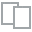
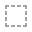
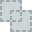
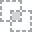
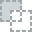
...
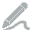
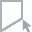
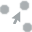
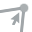
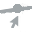

In [190]:
# Plot distribution of train df
plot(df_train)

100%|##########| 2/2 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]


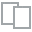
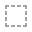
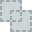
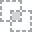
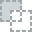
...
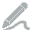
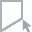
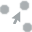
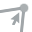
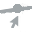

In [191]:
plot(df_train,'state')

### 3. Explore Target variable

target = 'montly _spendiing'

### 4. Explore Variables of Interest

In [192]:
# Set variables of interest
cat_vars= df_train[['category','is_fraud','merchant','gender','state']]
num_vars= df_train[['amt','merch_lat','merch_long','zip','lat','long','city_pop','transaction_date','dob','age_at_transaction']]
ord_vars= df_train[['transaction_date','dob','age_at_transaction']]

Additionally, identifiers like cc_num, acct_num, trans_num, ssn, first, last, street, city, and job may typically be excluded from numerical or categorical analysis as they are specific identifiers or personal information that may violate privacy concerns or provide no predictive value in a model.

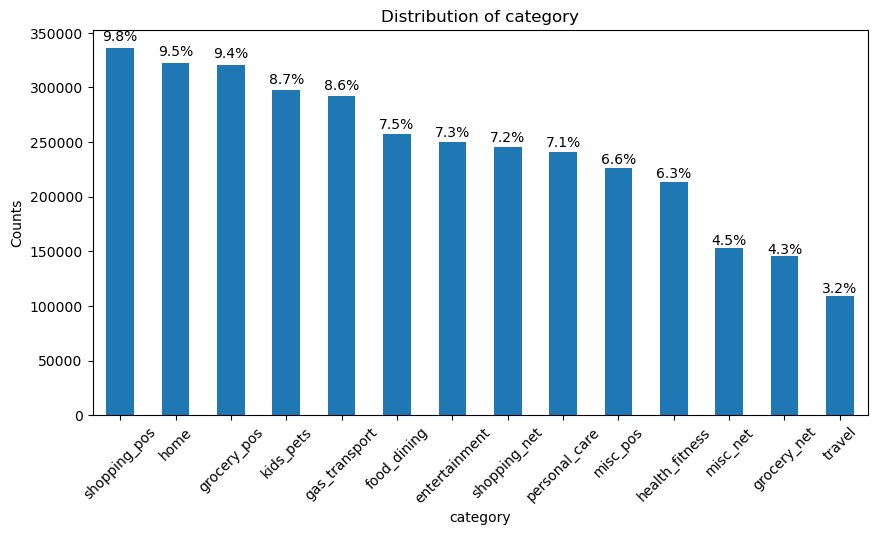

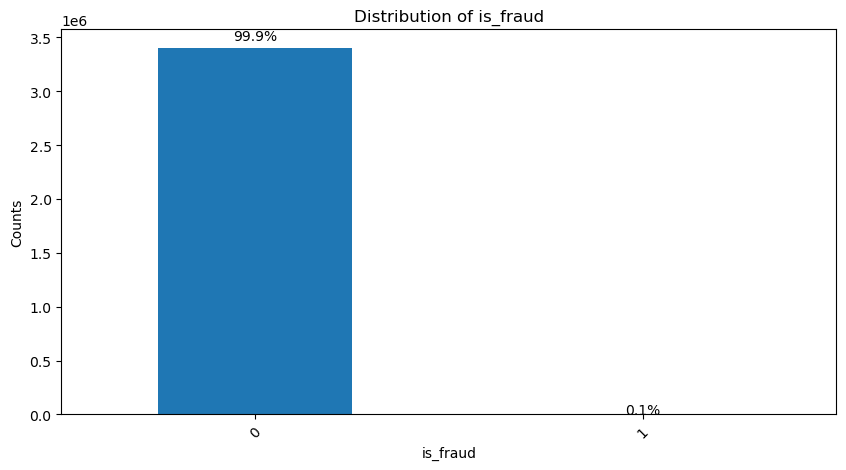

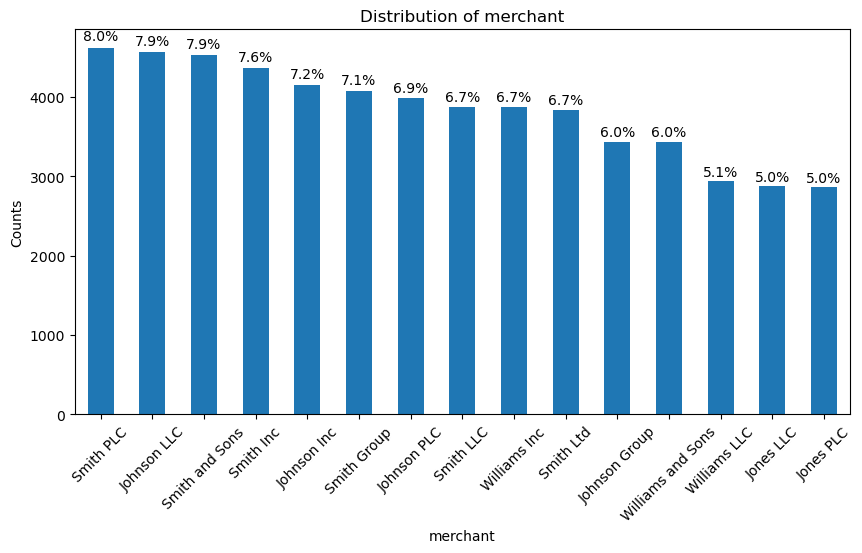

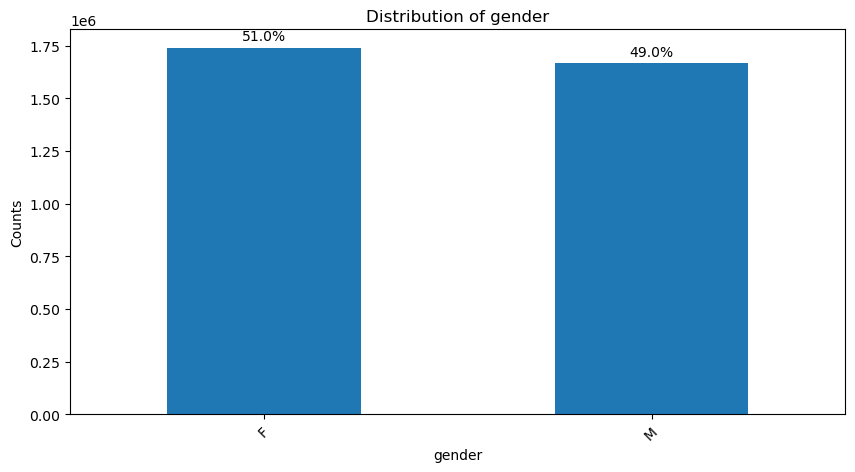

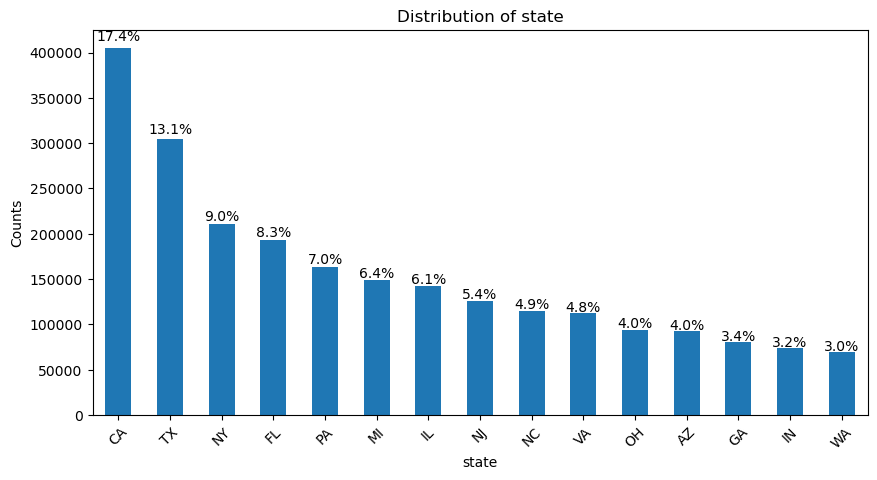

In [193]:
# Plot distribution of categorical variables
for cat_var in cat_vars:
    counts = df_train[cat_var].value_counts().head(15)
    total = counts.sum()

    plt.figure(figsize=(10, 5))
    ax = counts.plot(kind='bar')
    plt.title(f'Distribution of {cat_var}')
    plt.xlabel(cat_var)
    plt.ylabel('Counts')
    plt.xticks(rotation=45)

    for p in ax.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        ax.annotate(f'{(height/total)*100:.1f}%', (x + width/2, y + height*1.02), ha='center')

    plt.show()


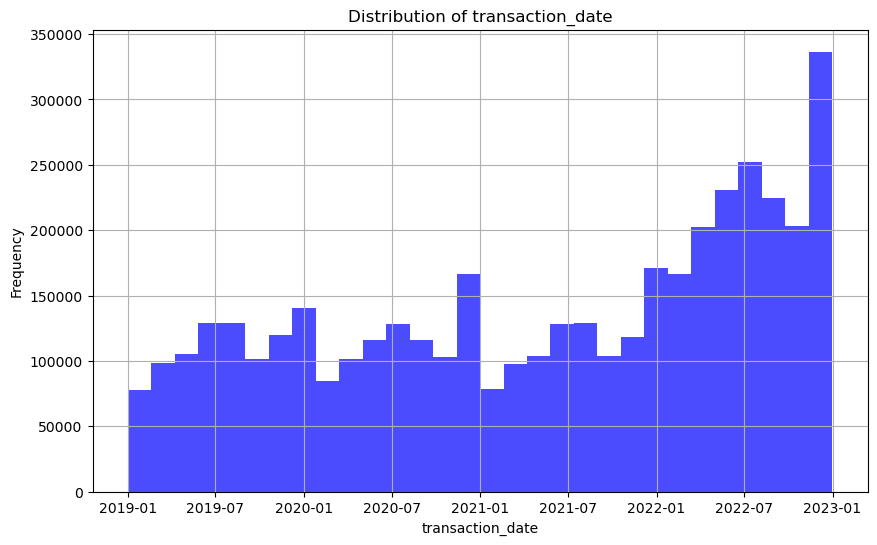

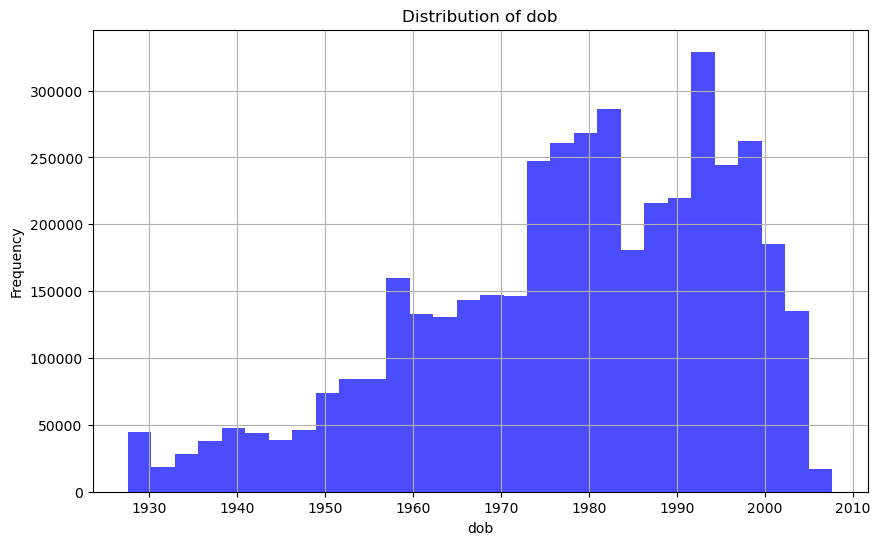

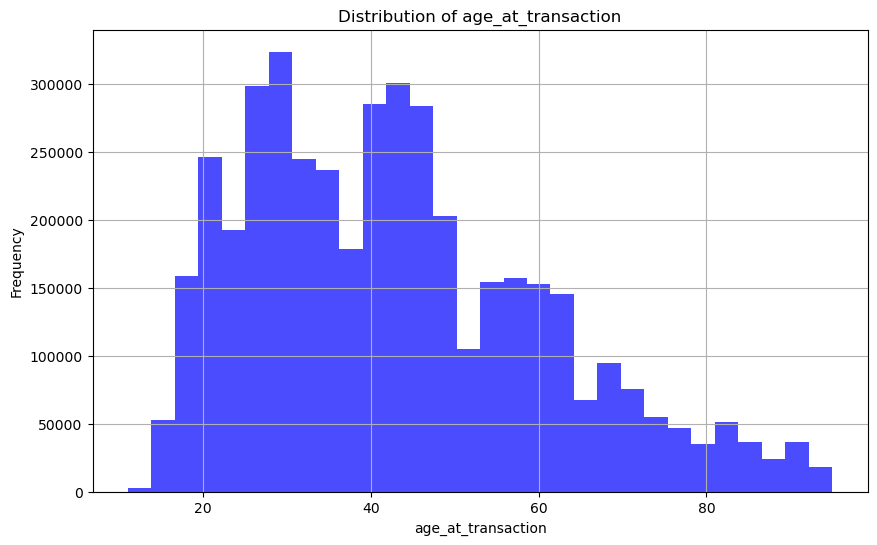

In [194]:
# Plot distribution of ordinal variables
for ord_var in ord_vars:
    plt.figure(figsize=(10, 6))
    plt.hist(df_merged[ord_var].dropna(), bins=30, color='blue', alpha=0.7)
    plt.title(f'Distribution of {ord_var}')
    plt.xlabel(ord_var)
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show()

# Generate box plots for numerical variables
for var in num_vars:
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=df_train, x=var)
    plt.title(f'Box Plot for {var}')
    plt.xlabel(var)
    plt.show()

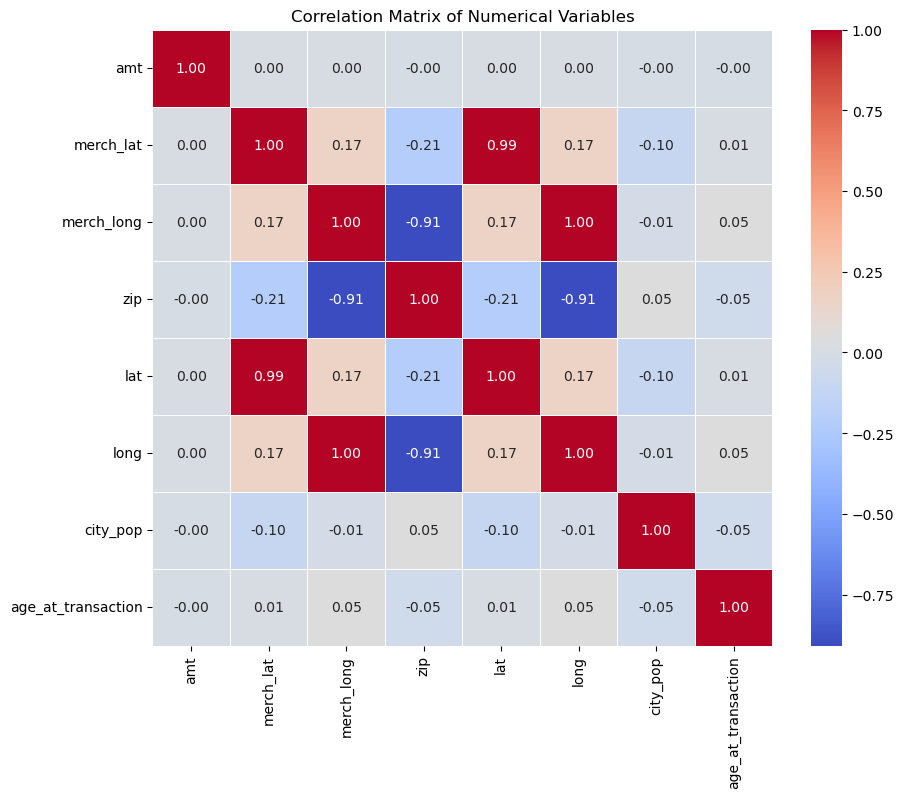

In [195]:
# Plot correlation between numerical variables
import seaborn as sns
corr_matrix = num_vars.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Numerical Variables')
plt.show()


In [196]:
num_vars.corr()

,amt,merch_lat,merch_long,zip,lat,long,city_pop,age_at_transaction
amt,1.000000,0.004536,0.002470,-0.000117,0.004669,0.002488,-0.004139,-0.001818
merch_lat,0.004536,1.000000,0.169183,-0.207726,0.994483,0.169279,-0.103016,0.008825
merch_long,0.002470,0.169183,1.000000,-0.906832,0.170041,0.999450,-0.014741,0.046998
zip,-0.000117,-0.207726,-0.906832,1.000000,-0.208796,-0.907322,0.051990,-0.047403
lat,0.004669,0.994483,0.170041,-0.208796,1.000000,0.170138,-0.103566,0.008853
long,0.002488,0.169279,0.999450,-0.907322,0.170138,1.000000,-0.014723,0.046988
city_pop,-0.004139,-0.103016,-0.014741,0.051990,-0.103566,-0.014723,1.000000,-0.048764
age_at_transaction,-0.001818,0.008825,0.046998,-0.047403,0.008853,0.046988,-0.048764,1.000000


In [197]:
df_train.corr()

,amt,is_fraud,merch_lat,merch_long,zip,lat,long,city_pop,age_at_transaction
amt,1.000000,0.099188,0.004536,0.002470,-0.000117,0.004669,0.002488,-0.004139,-0.001818
is_fraud,0.099188,1.000000,0.000672,0.000897,0.000204,0.000701,0.000918,0.000367,0.006737
merch_lat,0.004536,0.000672,1.000000,0.169183,-0.207726,0.994483,0.169279,-0.103016,0.008825
merch_long,0.002470,0.000897,0.169183,1.000000,-0.906832,0.170041,0.999450,-0.014741,0.046998
zip,-0.000117,0.000204,-0.207726,-0.906832,1.000000,-0.208796,-0.907322,0.051990,-0.047403
lat,0.004669,0.000701,0.994483,0.170041,-0.208796,1.000000,0.170138,-0.103566,0.008853
long,0.002488,0.000918,0.169279,0.999450,-0.907322,0.170138,1.000000,-0.014723,0.046988
city_pop,-0.004139,0.000367,-0.103016,-0.014741,0.051990,-0.103566,-0.014723,1.000000,-0.048764
age_at_transaction,-0.001818,0.006737,0.008825,0.046998,-0.047403,0.008853,0.046988,-0.048764,1.000000


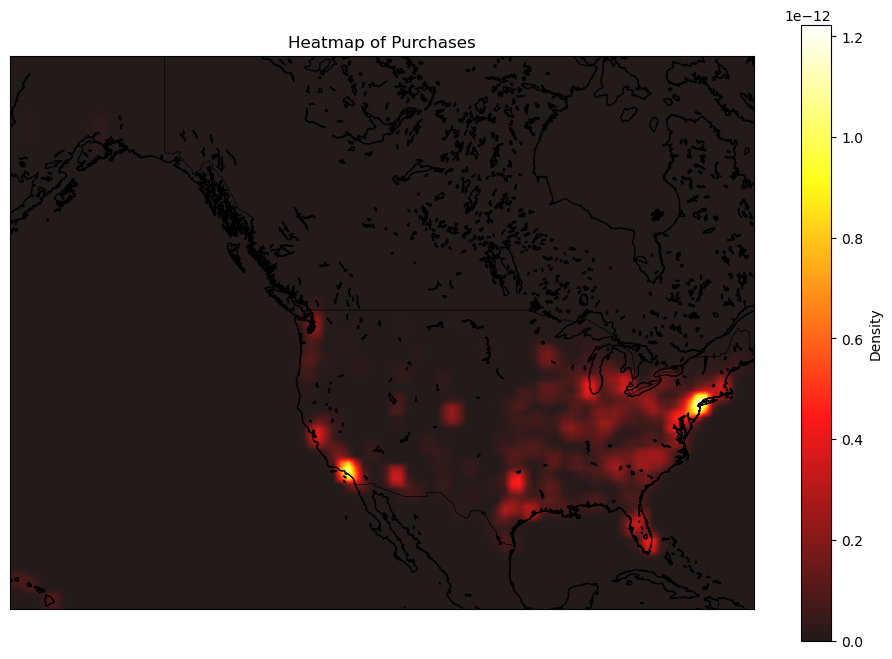

In [198]:
# Plot heatmap of purchases
fig, ax = plt.subplots(figsize=(12, 8))
m = Basemap(projection='merc', llcrnrlat=df_merged['merch_lat'].min() , urcrnrlat=df_merged['merch_lat'].max() ,
            llcrnrlon=df_merged['merch_long'].min() , urcrnrlon=df_merged['merch_long'].max() , resolution='i', ax=ax)

m.drawcoastlines()
m.drawcountries()

x, y = m(df_merged['merch_long'].values, df_merged['merch_lat'].values)
heatmap, xedges, yedges = np.histogram2d(x, y, bins=100, density=True)
extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]

plt.imshow(heatmap.T, extent=extent, origin='lower', cmap='hot', alpha=0.9, interpolation='bilinear')
plt.colorbar(label='Density')
plt.title('Heatmap of Purchases')
plt.show()


## Isolation Transaction by Month - addresing the business question

Montly Expense from 2019 to 2022 

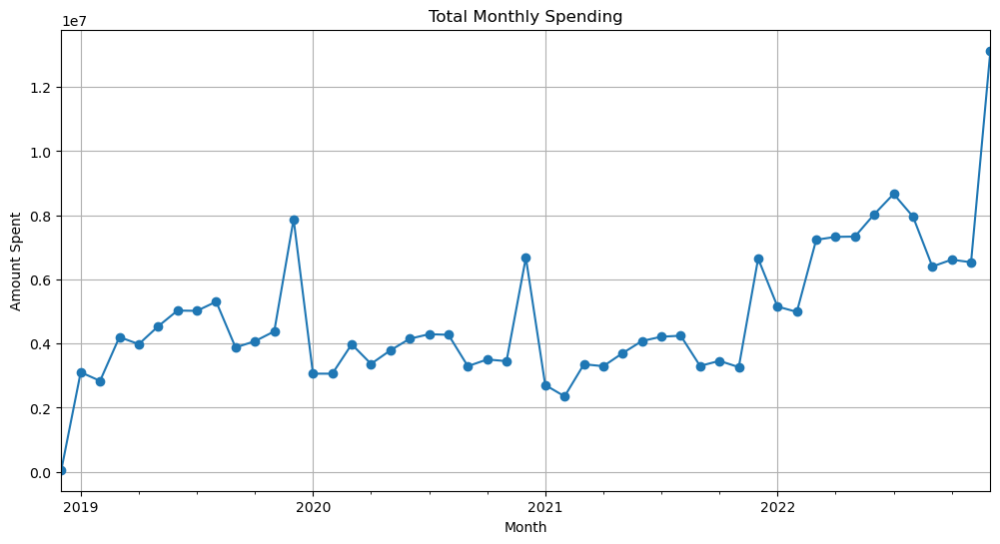

In [199]:
df_train['transaction_date'] = pd.to_datetime(df_train['transaction_date'])

# Extract year and month from 'transaction_date'
df_train['year_month'] = df_train['transaction_date'].dt.to_period('M')

# Group by new 'year_month' column and sum 'amt'
monthly_spending = df_train.groupby('year_month')['amt'].sum()

# Plotting
plt.figure(figsize=(12, 6))
monthly_spending.plot(kind='line', marker='o', linestyle='-')
plt.title('Total Monthly Spending')
plt.xlabel('Month')
plt.ylabel('Amount Spent')
plt.grid(True)
plt.show()

montly expense in 2022

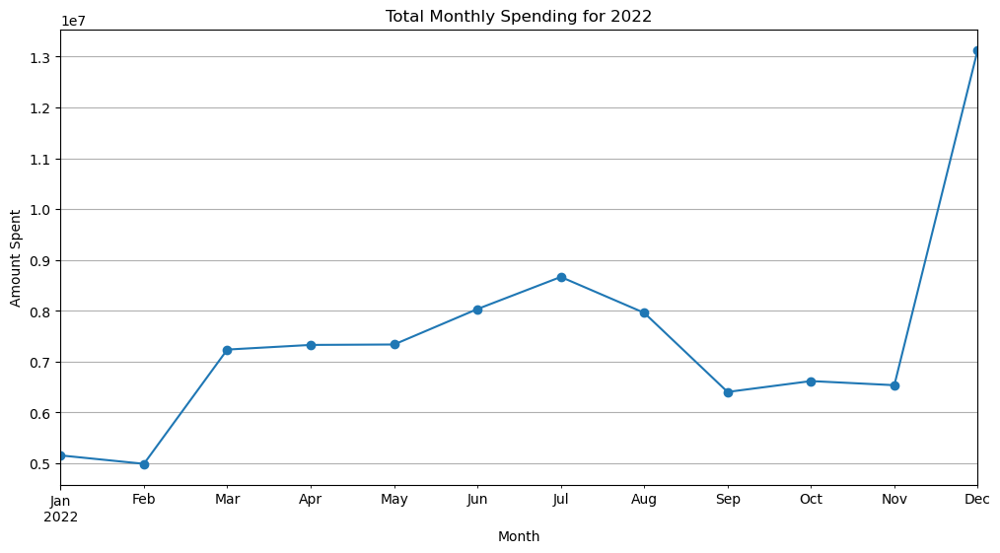

In [200]:
# Filter the data to include only the year 2022
df_2022 = df_train[df_train['transaction_date'].dt.year == 2022]

# Group by new 'year_month' column and sum 'amt'
monthly_spending_2022 = df_2022.groupby('year_month')['amt'].sum()

# Plotting
plt.figure(figsize=(12, 6))
monthly_spending_2022.plot(kind='line', marker='o', linestyle='-')
plt.title('Total Monthly Spending for 2022')
plt.xlabel('Month')
plt.ylabel('Amount Spent')
plt.grid(True)
plt.show()

In [201]:
# Create a column for year and month
df_train['year_month'] = df_train['transaction_date'].dt.to_period('M')

# Assuming 'acct_num' represents the unique customer identifier
# Group by customer account number and the 'year_month' column, then sum 'amt'
monthly_spending_per_customer = df_train.groupby(['acct_num', 'year_month'])['amt'].sum().reset_index()

# Renaming the aggregated column for clarity
monthly_spending_per_customer.rename(columns={'amt': 'monthly_total_spending'}, inplace=True)

# Display the first few rows to check the result
print(monthly_spending_per_customer.head())

     acct_num year_month  monthly_total_spending
0  2348758451    2018-12                   96.05
1  2348758451    2019-01                 2766.07
2  2348758451    2019-02                 2523.22
3  2348758451    2019-03                 2492.05
4  2348758451    2019-04                 3671.40


In [202]:
monthly_spending_per_customer.tail()

,acct_num,year_month,monthly_total_spending
43736,999389892260,2022-08,6000.92
43737,999389892260,2022-09,6321.62
43738,999389892260,2022-10,7366.21
43739,999389892260,2022-11,5552.29
43740,999389892260,2022-12,9621.86


In [203]:
# Group by gender and the 'year_month' column, then sum 'amt'
monthly_spending_by_gender = df_train.groupby(['gender', 'year_month'])['amt'].sum().reset_index()

# Renaming the aggregated column for clarity
monthly_spending_by_gender.rename(columns={'amt': 'monthly_total_spending'}, inplace=True)

# Display the first few rows to check the result
print(monthly_spending_by_gender.head())

  gender year_month  monthly_total_spending
0      F    2018-12                38017.10
1      F    2019-01              1860740.83
2      F    2019-02              1705345.79
3      F    2019-03              2562063.65
4      F    2019-04              2415026.85


Montly expense by gender 

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


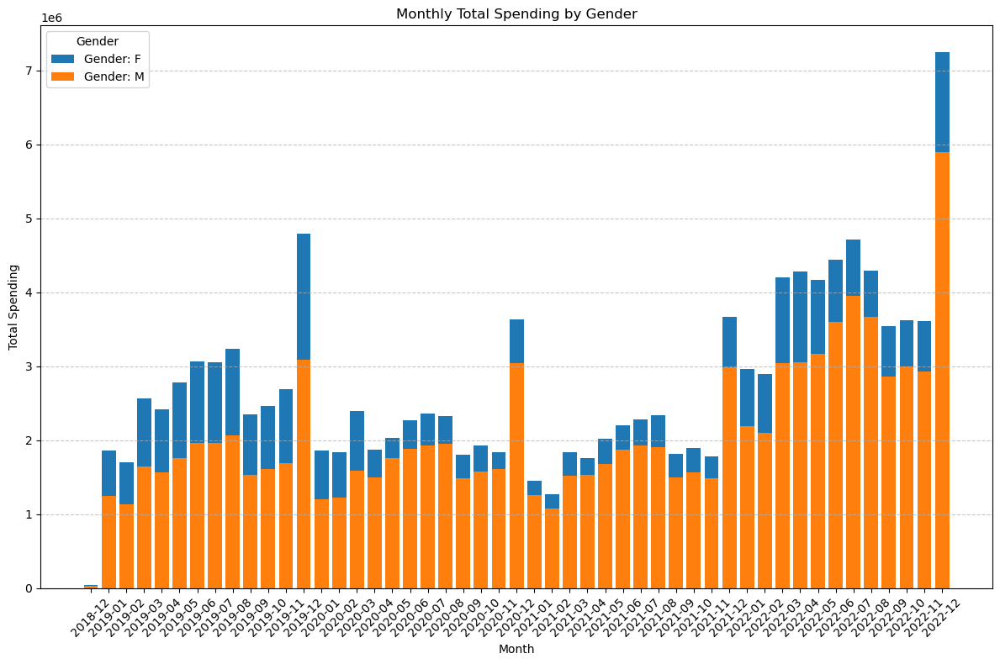

In [204]:
plt.figure(figsize=(12, 8))
for gender in monthly_spending_by_gender['gender'].unique():
    subset = monthly_spending_by_gender[monthly_spending_by_gender['gender'] == gender]
    plt.bar(subset['year_month'].astype(str), subset['monthly_total_spending'], label=f'Gender: {gender}')

plt.title('Monthly Total Spending by Gender')
plt.xlabel('Month')
plt.ylabel('Total Spending')
plt.xticks(rotation=45)  # Rotates the x-axis labels to make them more readable
plt.legend(title='Gender')
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Adds a horizontal grid line for better readability
plt.tight_layout()  # Adjusts plot parameters to give some padding
plt.show()

Montly Expense in 2020 by categories 

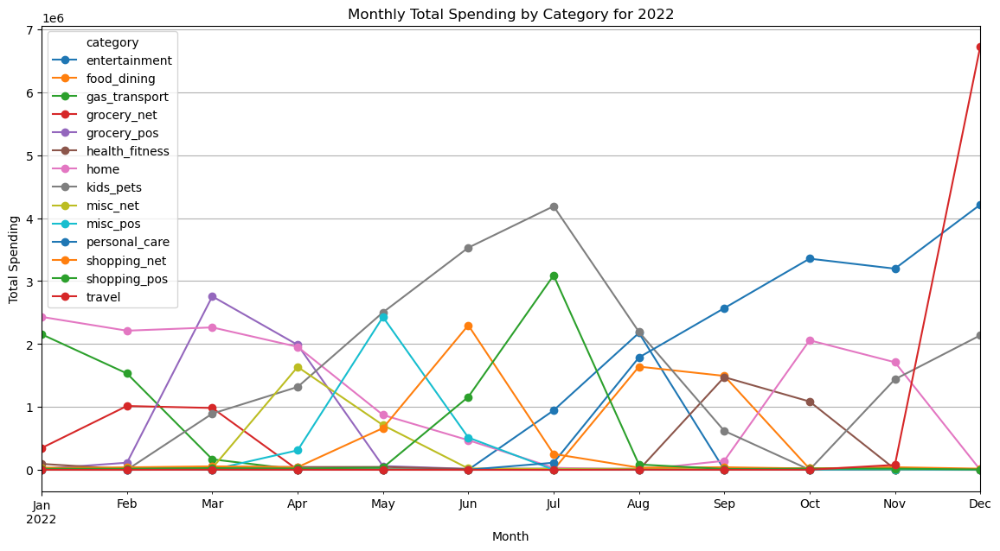

In [205]:
# Create a column for year and month
df_2022['year_month'] = df_2022['transaction_date'].dt.to_period('M')

# Group by both 'year_month' and 'category' and sum 'amt'
monthly_spending_by_category = df_2022.groupby(['year_month', 'category'])['amt'].sum().unstack()

# Plotting
plt.figure(figsize=(14, 7))
monthly_spending_by_category.plot(kind='line', marker='o', linestyle='-', ax=plt.gca())
plt.title('Monthly Total Spending by Category for 2022')
plt.xlabel('Month')
plt.ylabel('Total Spending')
plt.grid(True)

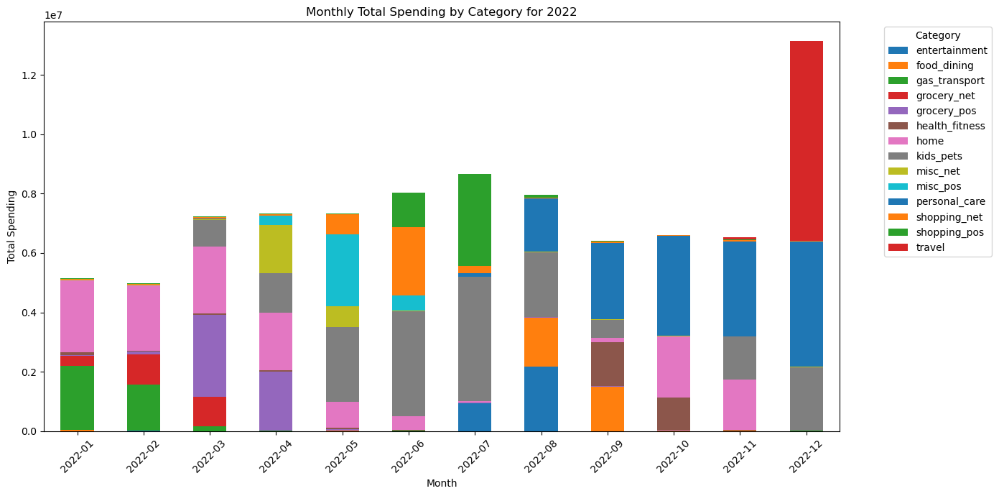

In [206]:
# Plotting
plt.figure(figsize=(14, 7))
monthly_spending_by_category.plot(kind='bar', stacked=True, ax=plt.gca())
plt.title('Monthly Total Spending by Category for 2022')
plt.xlabel('Month')
plt.ylabel('Total Spending')
plt.xticks(rotation=45)  # Rotate x-axis labels to improve readability
plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')  # Position legend outside the plot
plt.tight_layout()  # Adjust subplot parameters to give some space for the legend
plt.show()

Spending in january for year 2019,2020,2021 and 2022 

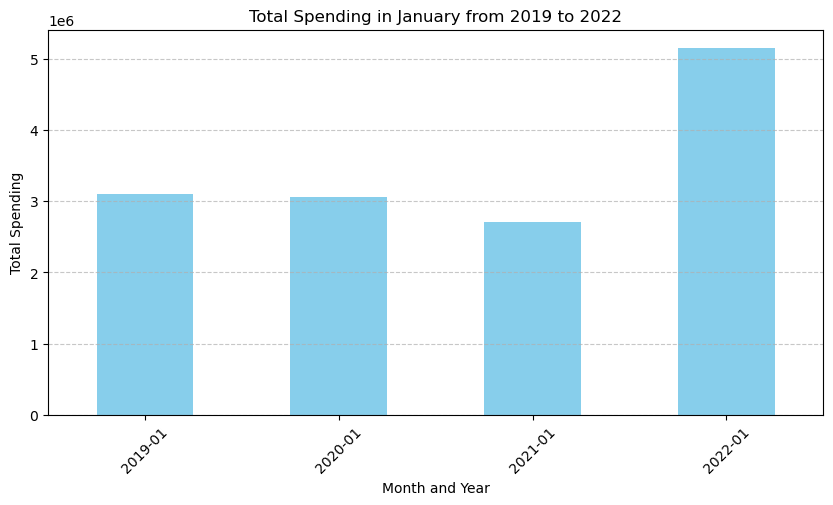

In [207]:
# Filter the data to include only January from 2019 to 2021
df_january = df_train[(df_train['transaction_date'].dt.month == 1) & 
                      (df_train['transaction_date'].dt.year.isin([2019, 2020, 2021, 2022]))]

# Group by 'year_month' and sum 'amt'
january_spending = df_january.groupby('year_month')['amt'].sum()

# Plotting
plt.figure(figsize=(10, 5))
january_spending.plot(kind='bar', color='skyblue')
plt.title('Total Spending in January from 2019 to 2022')
plt.xlabel('Month and Year')
plt.ylabel('Total Spending')
plt.xticks(rotation=45)  # Rotate x-axis labels to improve readability
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Adds a horizontal grid line for better readability
plt.show()

## 5. Prepare Data

In [208]:
df_cleaned = df_merged.copy()

In [209]:
df_cleaned.columns

Index(['cc_num', 'acct_num', 'trans_num', 'unix_time', 'category', 'amt',
       'is_fraud', 'merchant', 'merch_lat', 'merch_long', 'ssn', 'first',
       'last', 'gender', 'street', 'city', 'state', 'zip', 'lat', 'long',
       'city_pop', 'job', 'dob', 'transaction_date', 'age_at_transaction'],
      dtype='object')

#### Feature engineering 
Creating new variables from existing columns 

In [210]:


# Assuming df_cleaned is your main DataFrame

# Convert unix_time to datetime
df_cleaned['transaction_date'] = pd.to_datetime(df_cleaned['unix_time'], unit='s')

# Temporal Features
df_cleaned['monthly_spending'] = df_cleaned.groupby(['acct_num', df_cleaned['transaction_date'].dt.to_period("M")])['amt'].transform('sum')
df_cleaned['rolling_avg_spending'] = df_cleaned.groupby('acct_num')['amt'].rolling(window=3, min_periods=1).mean().reset_index(level=0, drop=True)

# Frequency Features
df_cleaned['monthly_transactions'] = df_cleaned.groupby(['acct_num', df_cleaned['transaction_date'].dt.to_period("M")])['trans_num'].transform('count')
df_cleaned['unique_merchants'] = df_cleaned.groupby(['acct_num', df_cleaned['transaction_date'].dt.to_period("M")])['merchant'].transform('nunique')

# Financial Metrics
df_cleaned['average_transaction'] = df_cleaned.groupby('acct_num')['amt'].transform('mean')
df_cleaned['max_transaction'] = df_cleaned.groupby('acct_num')['amt'].transform('max')
df_cleaned['min_transaction'] = df_cleaned.groupby('acct_num')['amt'].transform('min')

# Encode categorical data
df_cleaned = pd.get_dummies(df_cleaned, columns=['category'], prefix='cat')

# Example of age calculation
df_cleaned['age'] = (pd.to_datetime('today') - pd.to_datetime(df_cleaned['dob'])).dt.days // 365

# Aggregate features to customer-level for model input
features = df_cleaned.groupby('acct_num').agg({
    'monthly_spending': 'last',
    'rolling_avg_spending': 'last',
    'monthly_transactions': 'last',
    'unique_merchants': 'last',
    'average_transaction': 'mean',
    'max_transaction': 'max',
    'min_transaction': 'min',
    'age': 'first',
    # Add other features as necessary
}).reset_index()


In [211]:
# Display the features created
print("Features created after feature engineering:")
print(features.columns)
print(features.head())
print(df_cleaned.head())

Features created after feature engineering:
Index(['acct_num', 'monthly_spending', 'rolling_avg_spending',
       'monthly_transactions', 'unique_merchants', 'average_transaction',
       'max_transaction', 'min_transaction', 'age'],
      dtype='object')
     acct_num  monthly_spending  rolling_avg_spending  monthly_transactions  \
0  2348758451           9317.50             65.273333                   190   
1  2468061102          18979.94              5.610000                   310   
2  3005591724          11494.04              2.266667                   208   
3  3418322859          10911.14              5.806667                   212   
4  4322238535           3551.07             25.540000                    56   

   unique_merchants  average_transaction  max_transaction  min_transaction  \
0               182            57.774485          6548.64             1.00   
1               296            61.163223          3052.89             1.00   
2               200            62.0

In [212]:
# Check for null values in each column of df_merged
null_values = df_cleaned.isnull().sum()
print(null_values)

cc_num                  0
acct_num                0
trans_num               0
unix_time               0
amt                     0
is_fraud                0
merchant                0
merch_lat               0
merch_long              0
ssn                     0
first                   0
last                    0
gender                  0
street                  0
city                    0
state                   0
zip                     0
lat                     0
long                    0
city_pop                0
job                     0
dob                     0
transaction_date        0
age_at_transaction      0
monthly_spending        0
rolling_avg_spending    0
monthly_transactions    0
unique_merchants        0
average_transaction     0
max_transaction         0
min_transaction         0
cat_entertainment       0
cat_food_dining         0
cat_gas_transport       0
cat_grocery_net         0
cat_grocery_pos         0
cat_health_fitness      0
cat_home                0
cat_kids_pet

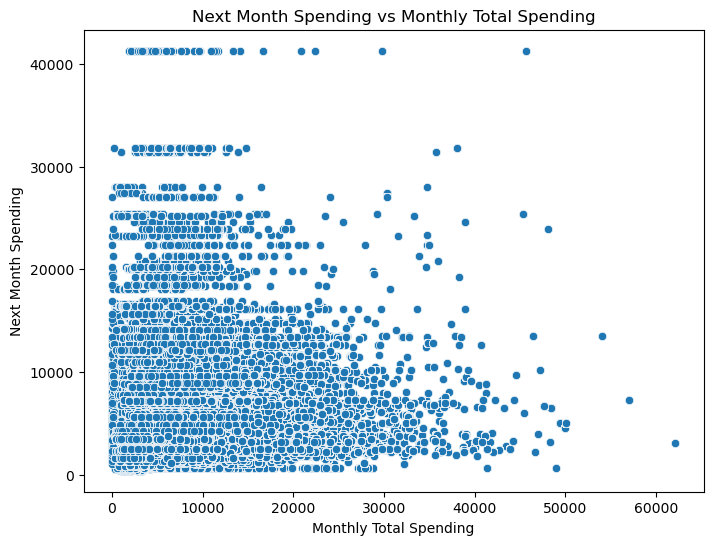

In [213]:
# Plotting scatter plot for 'next_month_spending' vs 'monthly_total_spending'
plt.figure(figsize=(8, 6))
sns.scatterplot(x='monthly_spending', y='max_transaction', data=df_cleaned)
plt.title('Next Month Spending vs Monthly Total Spending')
plt.xlabel('Monthly Total Spending')
plt.ylabel('Next Month Spending')
plt.show()


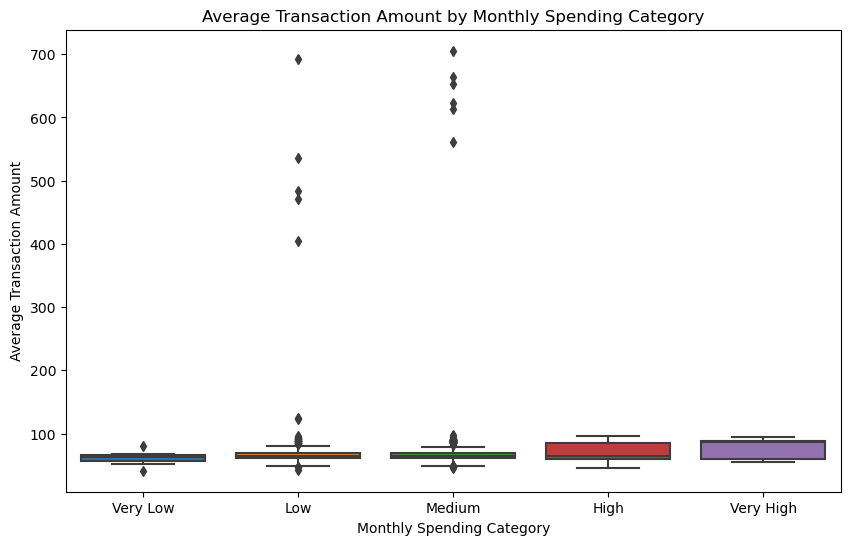

In [214]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Binning monthly_spending into categories
bins = [0, 1000, 5000, 10000, 20000, float('inf')]
labels = ['Very Low', 'Low', 'Medium', 'High', 'Very High']
features['spending_category'] = pd.cut(features['monthly_spending'], bins=bins, labels=labels)

# Box plot
plt.figure(figsize=(10, 6))
sns.boxplot(x='spending_category', y='average_transaction', data=features)
plt.title('Average Transaction Amount by Monthly Spending Category')
plt.xlabel('Monthly Spending Category')
plt.ylabel('Average Transaction Amount')
plt.show()


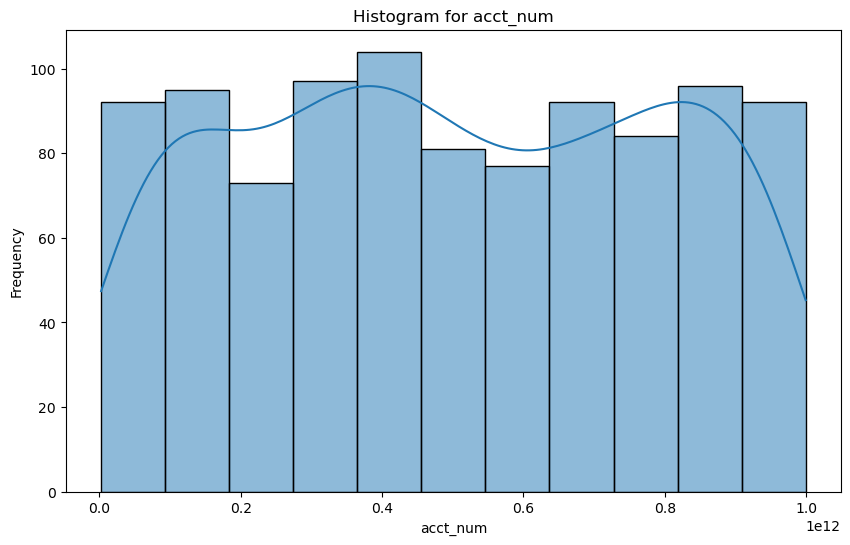

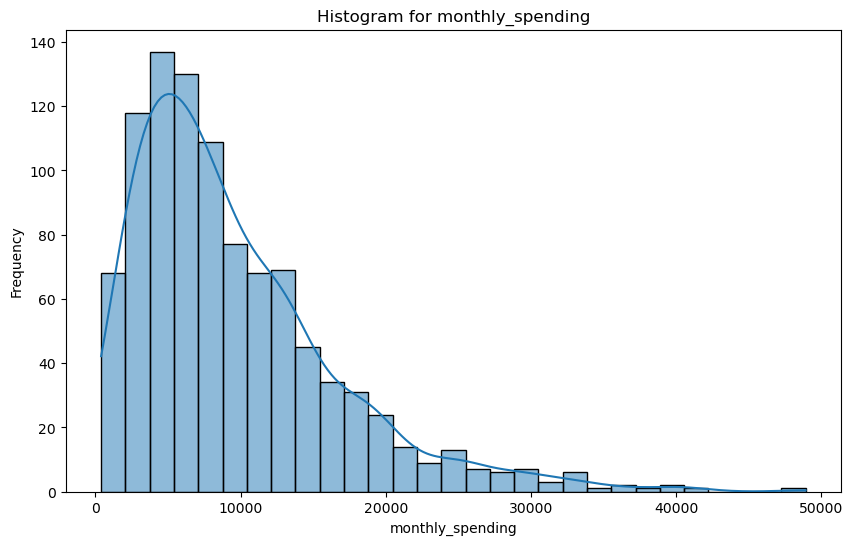

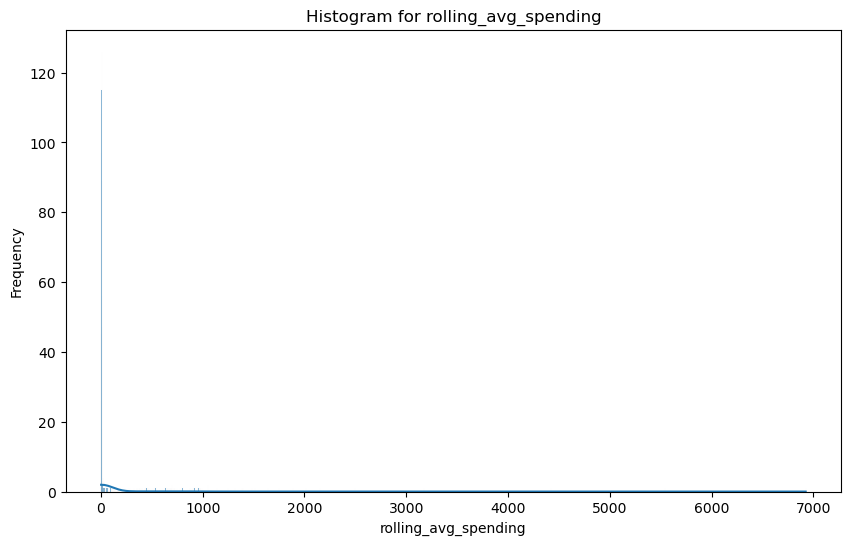

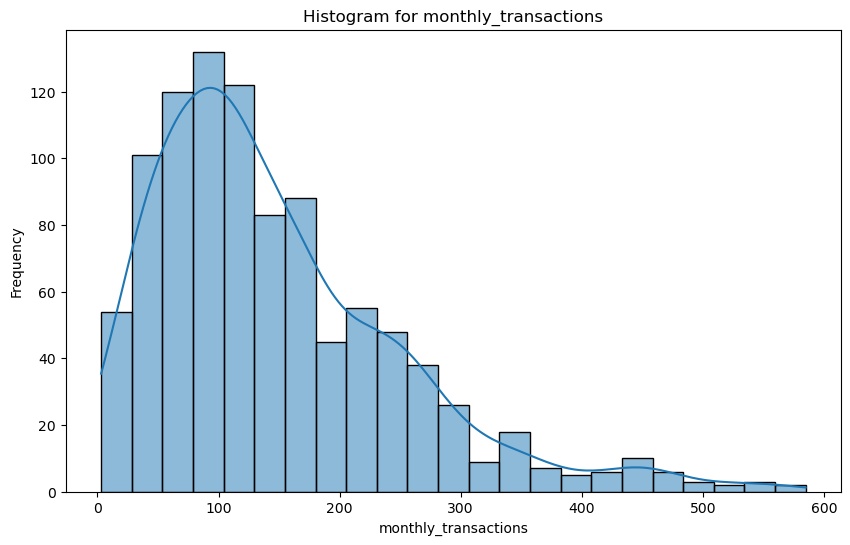

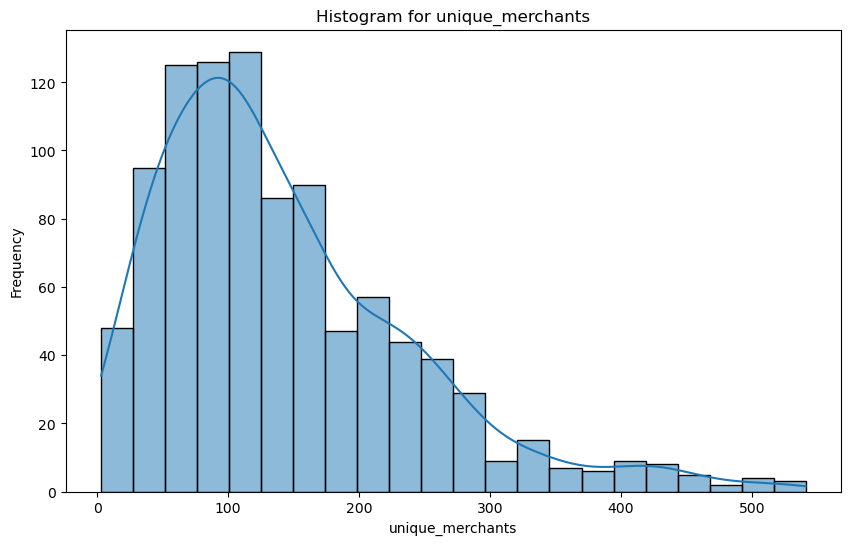

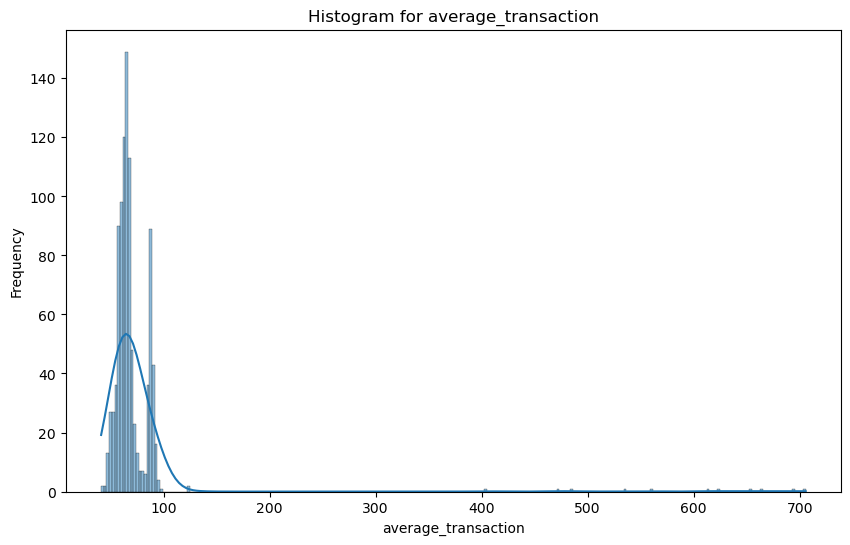

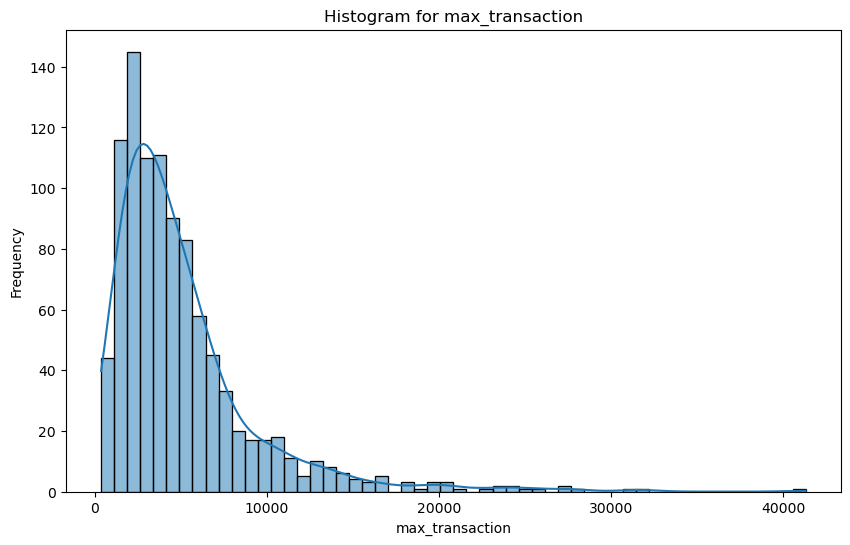

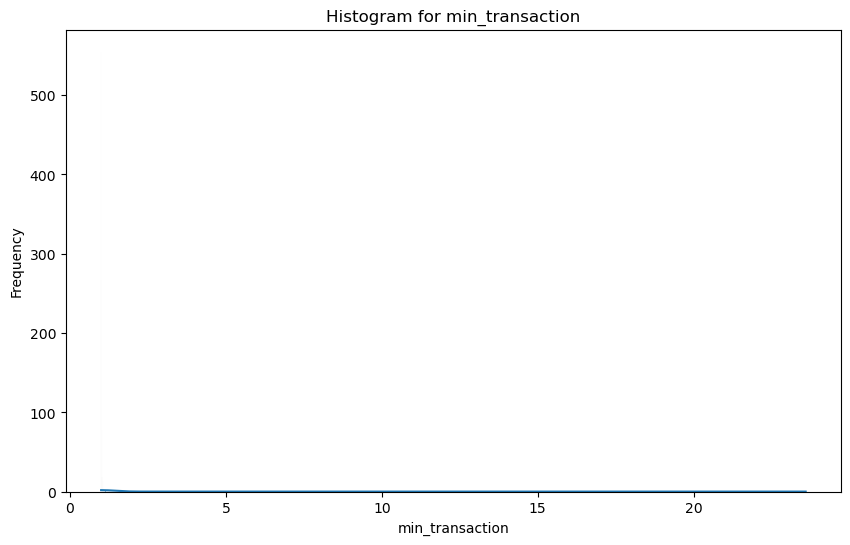

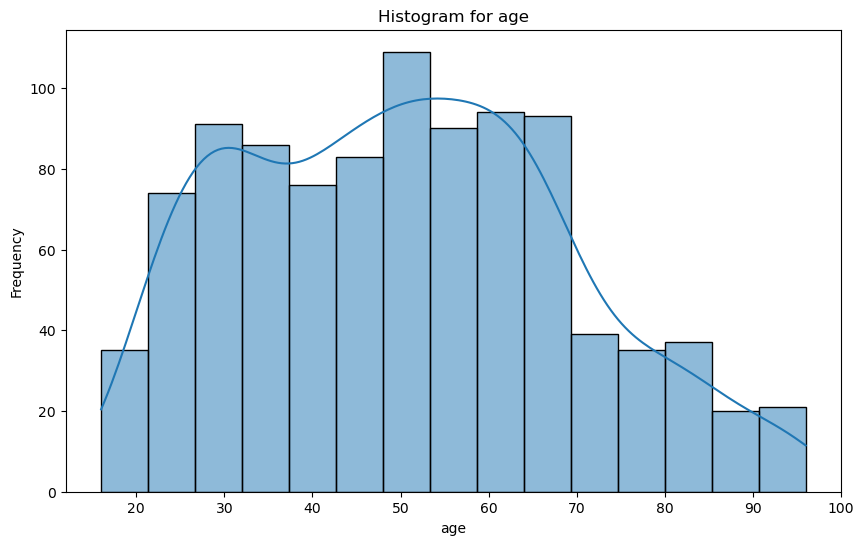

In [215]:
# List of numerical variables in the dataset
numerical_variables = features.select_dtypes(include=[np.number]).columns

# Generate histograms for numerical variables
for var in numerical_variables:
    plt.figure(figsize=(10, 6))
    sns.histplot(data=features, x=var, kde=True)
    plt.title(f'Histogram for {var}')
    plt.xlabel(var)
    plt.ylabel('Frequency')
    plt.show()

In [216]:
df_cleaned.columns

Index(['cc_num', 'acct_num', 'trans_num', 'unix_time', 'amt', 'is_fraud',
       'merchant', 'merch_lat', 'merch_long', 'ssn', 'first', 'last', 'gender',
       'street', 'city', 'state', 'zip', 'lat', 'long', 'city_pop', 'job',
       'dob', 'transaction_date', 'age_at_transaction', 'monthly_spending',
       'rolling_avg_spending', 'monthly_transactions', 'unique_merchants',
       'average_transaction', 'max_transaction', 'min_transaction',
       'cat_entertainment', 'cat_food_dining', 'cat_gas_transport',
       'cat_grocery_net', 'cat_grocery_pos', 'cat_health_fitness', 'cat_home',
       'cat_kids_pets', 'cat_misc_net', 'cat_misc_pos', 'cat_personal_care',
       'cat_shopping_net', 'cat_shopping_pos', 'cat_travel', 'age'],
      dtype='object')

In [217]:
columns_to_drop = [
    'cc_num', 'acct_num', 'trans_num', 'unix_time', 'amt', 'is_fraud',
    'merchant', 'merch_lat', 'merch_long', 'ssn', 'first', 'last', 'gender',
    'street', 'city', 'state', 'zip', 'lat', 'long', 'city_pop', 'job',
    'dob', 'transaction_date', 'age_at_transaction', 
]

# Drop the specified columns and modify the DataFrame in place
df_cleaned.drop(columns=columns_to_drop, axis=1, inplace=True)

# Display the updated DataFrame to verify the columns have been dropped
print(df_cleaned.columns)

Index(['monthly_spending', 'rolling_avg_spending', 'monthly_transactions',
       'unique_merchants', 'average_transaction', 'max_transaction',
       'min_transaction', 'cat_entertainment', 'cat_food_dining',
       'cat_gas_transport', 'cat_grocery_net', 'cat_grocery_pos',
       'cat_health_fitness', 'cat_home', 'cat_kids_pets', 'cat_misc_net',
       'cat_misc_pos', 'cat_personal_care', 'cat_shopping_net',
       'cat_shopping_pos', 'cat_travel', 'age'],
      dtype='object')


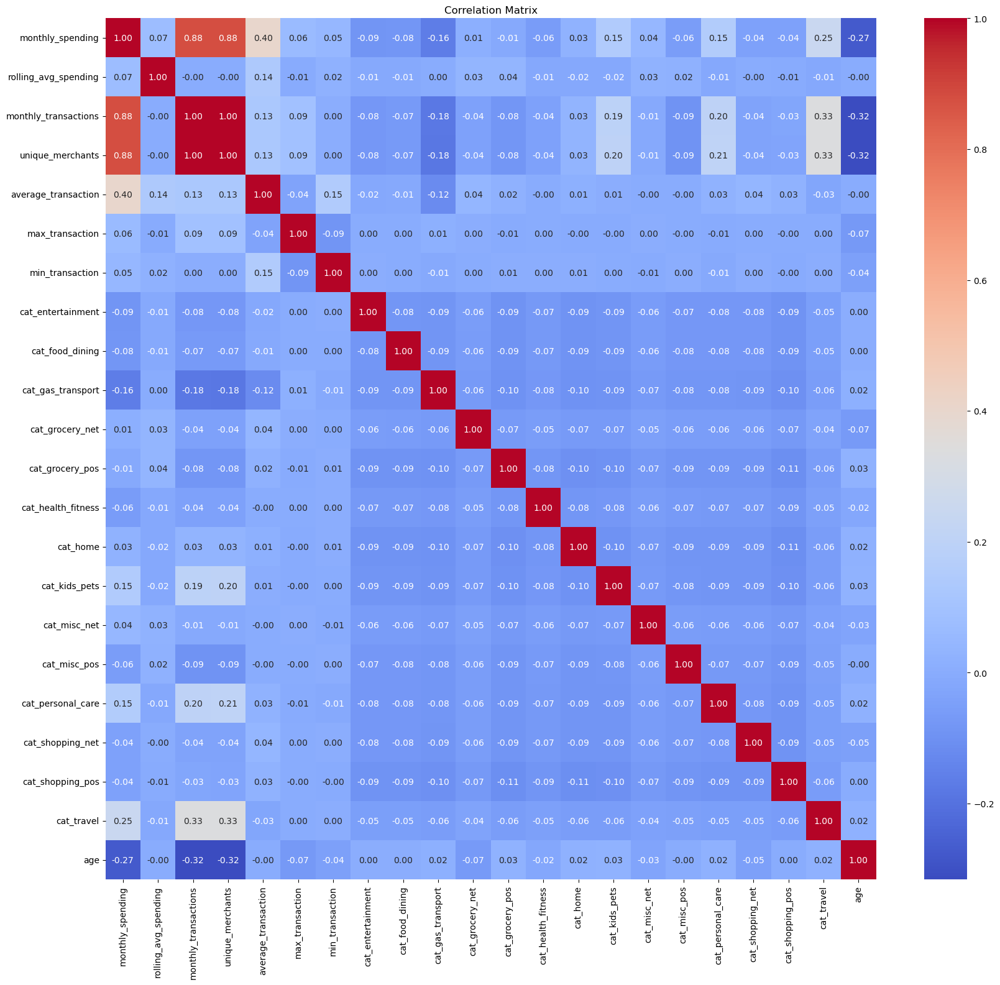

In [218]:
# Assuming 'df_cleaned' is your DataFrame and it contains both the features and the target variable
correlation_matrix = df_cleaned.corr()

# Plotting the correlation matrix
plt.figure(figsize=(20, 18))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()


according to correlation matrix we can clearly see that 'rolling_avg_spending', 'monthly_transactions',
       'unique_merchants', 'average_transaction', 'max_transaction',
       'min_transaction' have high correlation with monthly_spending

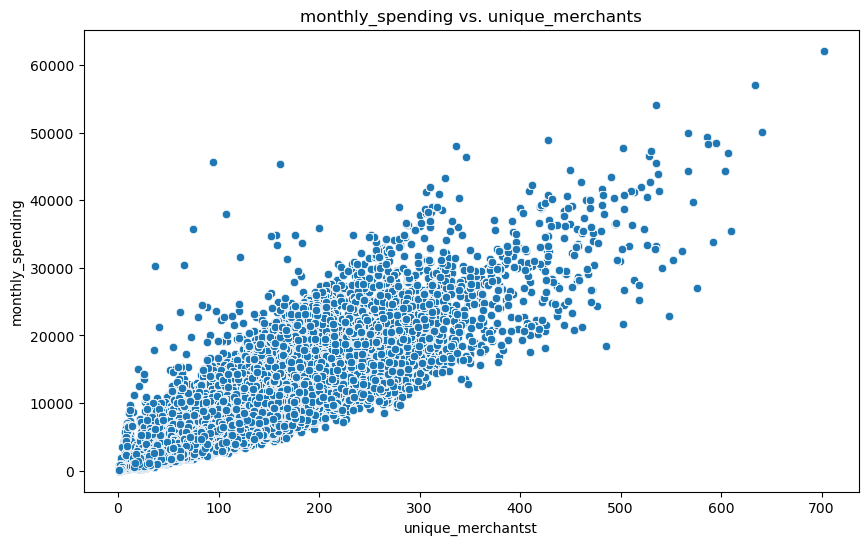

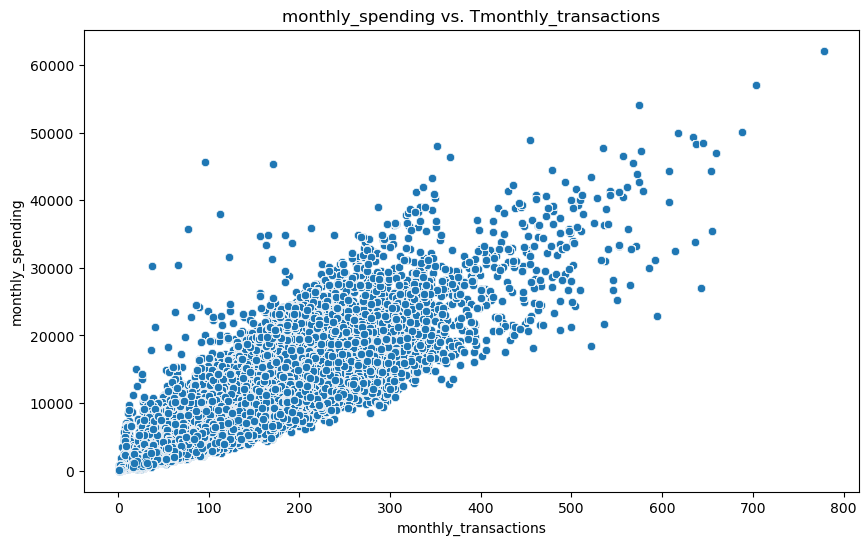

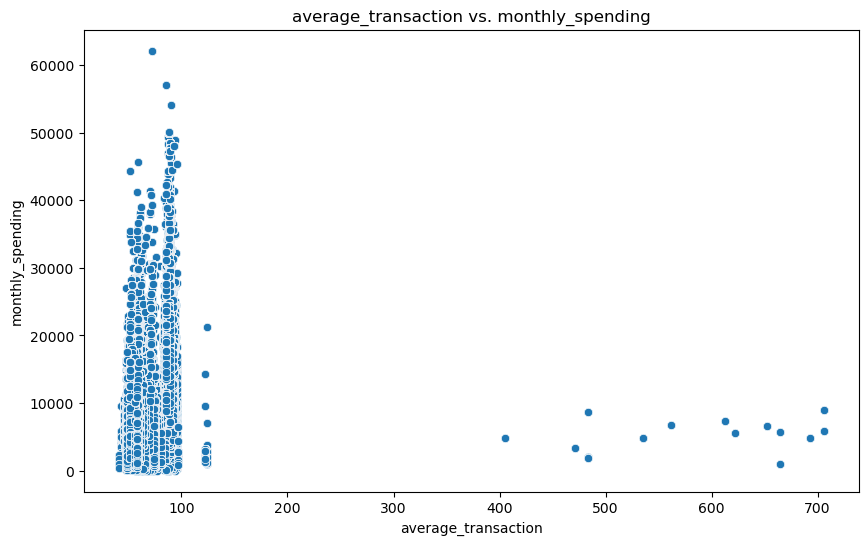

In [219]:
import matplotlib.pyplot as plt
import seaborn as sns

# Scatter plot for CLV and Average Transaction Amount
plt.figure(figsize=(10, 6))
sns.scatterplot(x='unique_merchants', y='monthly_spending', data=df_cleaned)
plt.title('monthly_spending vs. unique_merchants')
plt.xlabel('unique_merchantst')
plt.ylabel('monthly_spending')
plt.show()

# Scatter plot for CLV and Total Transaction Amount
plt.figure(figsize=(10, 6))
sns.scatterplot(x='monthly_transactions', y='monthly_spending', data=df_cleaned)
plt.title('monthly_spending vs. Tmonthly_transactions')
plt.xlabel('monthly_transactions')
plt.ylabel('monthly_spending')
plt.show()

# Scatter plot for CLV and Transaction Frequency
plt.figure(figsize=(10, 6))
sns.scatterplot(x='average_transaction', y='monthly_spending', data=df_cleaned)
plt.title('average_transaction vs. monthly_spending')
plt.xlabel('average_transaction')
plt.ylabel('monthly_spending')
plt.show()


In [220]:
# Setting the desired sample size as 1% of the original dataset
sample_size = int(len(df_cleaned) * 0.01)

# Randomly sample the data
df_cleaned = df_cleaned.sample(n=sample_size, random_state=42)

## 6. Splitting the data

In [221]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

# Assuming all new features have been calculated and exist in df_cleaned
# Prepare X and y
X = df_cleaned[['rolling_avg_spending', 'monthly_transactions',
       'unique_merchants', 'average_transaction', 'max_transaction',
       'min_transaction']]

y = df_cleaned['monthly_spending']  # Set the target variable

# Data Splitting
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Feature Scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
# Check the size of each set
print("Training set size:", X_train.shape)
print("Test set size:", X_test.shape)

Training set size: (34087, 6)
Test set size: (8522, 6)


### 7 . Baseline Model 

In [222]:
# Calculate performance metrics for the baseline (e.g., using mean or median)
y_baseline = np.full_like(y_test, y_train.mean())  # Use mean as the baseline
baseline_mse = mean_squared_error(y_test, y_baseline, squared=False)
baseline_rmse = np.sqrt(baseline_mse)
baseline_r2 = r2_score(y_test, y_baseline)

print("Baseline Performance Metrics:")
print("Mean Squared Error (MSE):", baseline_mse)
print("Root Mean Squared Error (RMSE):", baseline_rmse)
print("R-squared (R2) Score:", baseline_r2)

Baseline Performance Metrics:
Mean Squared Error (MSE): 7396.185335048126
Root Mean Squared Error (RMSE): 86.00107752259925
R-squared (R2) Score: -8.327789997952806e-05


###   8. Regression model

### linear Regression 

Mean Squared Error (MSE): 2682.4982187915025
Root Mean Squared Error (RMSE): 51.79283945480787
R-squared (R2) Score: 0.8684473867482698
Print the first 10 predictions:
[ 7356.36342502 22744.14353046 10204.30415204  1584.95251761
  2810.98107937 16998.86113448  9177.42787547 11948.99519809
 25091.56082688 18051.06513153]


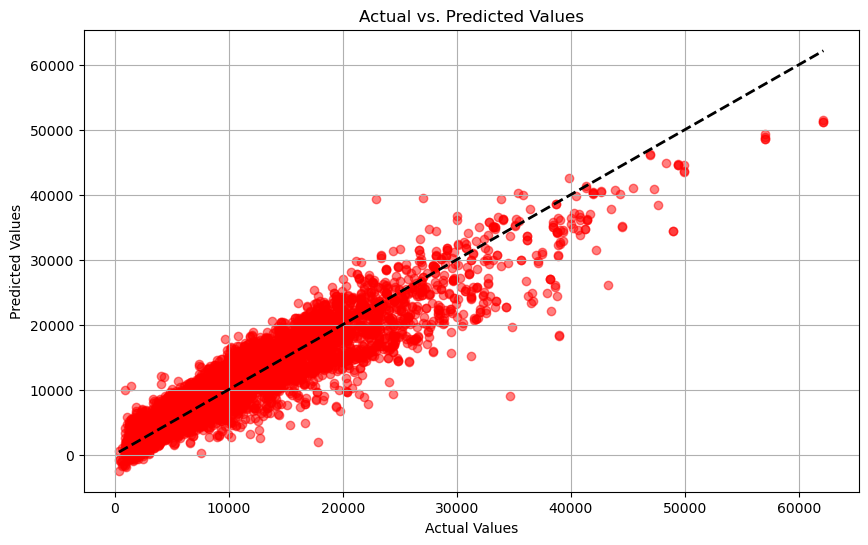

In [223]:
# Model Training
# Create a linear regression model
reg_model = LinearRegression()

# Train the model on the training data
reg_model.fit(X_train, y_train)

# Make predictions on the testing data
y_pred = reg_model.predict(X_test)

mse = mean_squared_error(y_test, y_pred, squared=False)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("R-squared (R2) Score:", r2)

# Print the first 10 predictions
print("Print the first 10 predictions:")
print(y_pred[:10])

# Plotting actual vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.5, color='red')  # Plotting actual vs predicted values
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)  # A diagonal line where actual=predicted
plt.title('Actual vs. Predicted Values')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.grid(True)
plt.show()

In [224]:
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import learning_curve

### learning curve data

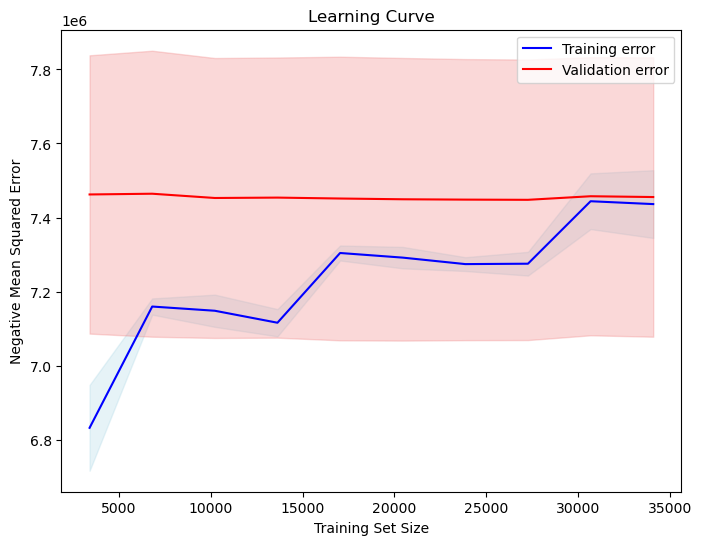

In [225]:
# Generate the learning curve data
train_sizes, train_scores, test_scores = learning_curve(reg_model, X, y, cv=5, scoring='neg_mean_squared_error', train_sizes=np.linspace(0.1, 1.0, 10))

# Calculate the mean and standard deviation of training and test scores
train_mean = -np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = -np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# Plot the learning curve
plt.figure(figsize=(8, 6))
plt.plot(train_sizes, train_mean, label='Training error', color='blue')
plt.plot(train_sizes, test_mean, label='Validation error', color='red')

# Draw the bands
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, color='lightblue', alpha=0.3)
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, color='lightcoral', alpha=0.3)

# Add labels and title
plt.xlabel('Training Set Size')
plt.ylabel('Negative Mean Squared Error')
plt.title('Learning Curve')
plt.legend(loc='best')

# Show the plot
plt.show()

Best Hyperparameters: {'fit_intercept': True}
Mean Squared Error (MSE): 2682.4982187915025
Root Mean Squared Error (RMSE): 51.79283945480787
R-squared (R2) Score: 0.8684473867482698

Print the first 10 predictions:
[ 7356.36342502 22744.14353046 10204.30415204  1584.95251761
  2810.98107937 16998.86113448  9177.42787547 11948.99519809
 25091.56082688 18051.06513153]


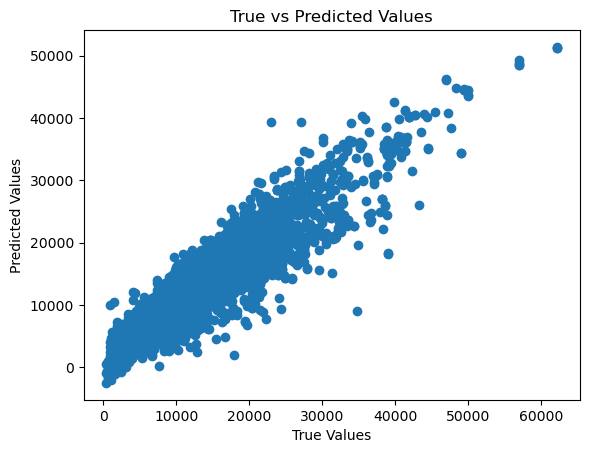

In [226]:
# Define the hyperparameters to tune
param_grid = {
    'fit_intercept': [True, False]
}

# Create a linear regression model
reg_model = LinearRegression()

# Perform grid search with cross-validation
reg_model_grid_search = GridSearchCV(reg_model, param_grid, cv=5)
reg_model_grid_search.fit(X_train, y_train)

# Get the best hyperparameters and model
best_params = reg_model_grid_search.best_params_
best_model = reg_model_grid_search.best_estimator_

# Make predictions on the testing data using the best model
y_pred = best_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred, squared=False)
rmse = np.sqrt(mse)
r2_score = best_model.score(X_test, y_test)

print("Best Hyperparameters:", best_params)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("R-squared (R2) Score:", r2_score, end="\n\n")

# Print the first 10 predictions
print("Print the first 10 predictions:")
print(y_pred[:10])

# Create a scatter plot of true vs predicted values
plt.scatter(y_test, y_pred)
plt.xlabel('True Values')
plt.ylabel('Predicted Values')
plt.title('True vs Predicted Values')
plt.show()

### Random forest

In [232]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error


X = df_cleaned[['rolling_avg_spending', 'monthly_transactions',
       'unique_merchants', 'average_transaction', 'max_transaction',
       'min_transaction']]

y = df_cleaned['monthly_spending']  # Set the target variable

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a random forest regressor
rf_model = RandomForestRegressor(random_state=42)

# Train the model on the training data
rf_model.fit(X_train, y_train)

# Make predictions on the testing data
y_pred = rf_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred, squared=False)
rmse = np.sqrt(mse)
r2_score = rf_model.score(X_test, y_test)

print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("R-squared (R2) Score:", r2_score)

Mean Squared Error (MSE): 1885.224810557498
Root Mean Squared Error (RMSE): 43.41917560891153
R-squared (R2) Score: 0.9350249101922044


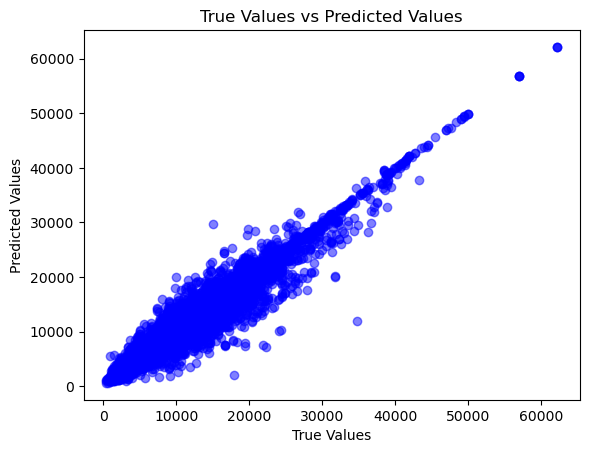

In [233]:
import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams['agg.path.chunksize'] = 1000  # Adjust the value as needed

# Create a scatter plot of true values versus predicted values
plt.scatter(y_test, y_pred, color='blue', alpha=0.5)
plt.xlabel('True Values')
plt.ylabel('Predicted Values')
plt.title('True Values vs Predicted Values')
plt.show()

### Gradient boosting 

In [234]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

X = df_cleaned[['rolling_avg_spending', 'monthly_transactions',
       'unique_merchants', 'average_transaction', 'max_transaction',
       'min_transaction']]

y = df_cleaned['monthly_spending']  # Set the target variable

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a Gradient Boosting regressor
gb_model = GradientBoostingRegressor(random_state=42)

# Train the model on the training data
gb_model.fit(X_train, y_train)

# Make predictions on the testing data
y_pred = gb_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred, squared=False)
rmse = np.sqrt(mse)
r2_score = gb_model.score(X_test, y_test)

print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("R-squared (R2) Score:", r2_score)

Mean Squared Error (MSE): 2409.7069226739345
Root Mean Squared Error (RMSE): 49.088765748121375
R-squared (R2) Score: 0.893842900056041
